<a href="https://colab.research.google.com/github/chayhuixiang/DAC2022/blob/master/GRAB_HX_Organized.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports and Setup

In [ ]:
from google.colab import drive

drive.mount('/content/gdrive')
root_path = 'gdrive/My Drive/Work 2021/Grab_Data/Grab-Posisi dataset'  #change dir to your project folder

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
!unzip gdrive/My\ Drive/Work\ 2021/Grab_Data/Grab-Posisi\ dataset/grab-posis-city=Jakarta.zip
!unzip gdrive/My\ Drive/Work\ 2021/Grab_Data/Grab-Posisi\ dataset/grab-posis-city=Singapore.zip

Archive:  gdrive/My Drive/Work 2021/Grab_Data/Grab-Posisi dataset/grab-posis-city=Jakarta.zip
replace city=Jakarta/part-00003-8bbff892-97d2-4011-9961-703e38972569.c000.snappy.parquet? [y]es, [n]o, [A]ll, [N]one, [r]ename: Archive:  gdrive/My Drive/Work 2021/Grab_Data/Grab-Posisi dataset/grab-posis-city=Singapore.zip
replace city=Singapore/part-00003-8bbff892-97d2-4011-9961-703e38972569.c000.snappy.parquet? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: city=Singapore/part-00003-8bbff892-97d2-4011-9961-703e38972569.c000.snappy.parquet  
  inflating: city=Singapore/part-00008-8bbff892-97d2-4011-9961-703e38972569.c000.snappy.parquet  
  inflating: city=Singapore/part-00004-8bbff892-97d2-4011-9961-703e38972569.c000.snappy.parquet  
  inflating: city=Singapore/part-00005-8bbff892-97d2-4011-9961-703e38972569.c000.snappy.parquet  
  inflating: city=Singapore/part-00002-8bbff892-97d2-4011-9961-703e38972569.c000.snappy.parquet  
  inflating: city=Singapore/part-00009-8bbff892-97d2-4011-99

In [ ]:
# pip install the additional dependencies
!pip install pyarrow
!pip install fastparquet
!pip install geopandas
!pip install keplergl

In [ ]:
# import necessary libraries
import pandas as pd
import datetime
from keplergl import KeplerGl
import seaborn as sns
import dask
import dask.dataframe as dd

In [ ]:
# to view Kepler GL output
from google.colab import output
output.enable_custom_widget_manager()

In [ ]:
# Loading Singapore / Jakarta data into dataframe
raw_df = pd.DataFrame()
data = 'Singapore'
for i in range(0,10):  
  df = pd.read_parquet(f'city=Singapore/part-0000{i}-8bbff892-97d2-4011-9961-703e38972569.c000.snappy.parquet')
  raw_df = raw_df.append(df)

In [ ]:
# Using dask to load Jakarta data (if it's too large)
ddf_list = []
for i in range(0,10):
  ddf_list.append(dd.read_parquet(f'city=Jakarta/part-0000{i}-8bbff892-97d2-4011-9961-703e38972569.c000.snappy.parquet'))

ddf = dd.concat(ddf_list)
ddf.shape

(Delayed('int-a2486164-81d4-44ad-a76f-e65eff21f908'), 9)

In [ ]:
# Getting some basic information like shape
print(raw_df.shape)
print(raw_df.info())

(30329685, 9)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 30329685 entries, 0 to 3032568
Data columns (total 9 columns):
 #   Column         Dtype  
---  ------         -----  
 0   trj_id         object 
 1   driving_mode   object 
 2   osname         object 
 3   pingtimestamp  int64  
 4   rawlat         float64
 5   rawlng         float64
 6   speed          float64
 7   bearing        int64  
 8   accuracy       float64
dtypes: float64(4), int64(2), object(3)
memory usage: 2.3+ GB
None


In [ ]:
# Getting a sample of 3 random points in the dataframe
raw_df.sample(3)

,trj_id,driving_mode,osname,pingtimestamp,rawlat,rawlng,speed,bearing,accuracy
1756928,71923,car,android,1555647862,1.425729,103.797936,17.580000,221,15.17
1507287,73196,car,android,1555741620,1.331015,103.903011,0.000000,0,3.00
2827303,745,car,ios,1555866813,1.339721,103.805639,21.732225,312,12.00


# Data Compressing & Processing (with Pandas)


In [ ]:
# Functions to compress dataframe 

def to_category(df,*args):
  for col_name in args:
    df[col_name] = df[col_name].astype("category")

def to_float32(df, *args):
  for col_name in args:
    df[col_name] = df[col_name].astype("float32")
  
def to_uint16(df, *args):
  for col_name in args:
    df[col_name] = df[col_name].astype("uint16")

def to_int32(df,*args):
  for col_name in args:
    df[col_name] = df[col_name].astype("int32")

def format_datetime(df, col_name):
  dt = df[col_name].apply(datetime.datetime.fromtimestamp)
  df["weekend"] = dt.apply(lambda x: (x.weekday() == 5 or x.weekday() == 6))
  df["hour"] = dt.apply(lambda x: x.hour)

In [ ]:
# Drop unimportant columns
columns_to_drop = ["bearing","accuracy","osname","driving_mode"]
df_formatted = raw_df.drop(columns = columns_to_drop)

In [ ]:
# Compressing the data
to_float32(df_formatted,["rawlat","rawlng","speed"])
to_category(df_formatted,["trj_id"])
format_datetime(df_formatted, "pingtimestamp")

In [ ]:
# Seeing how the dataframe looks after processing
df_formatted.head()

,trj_id,pingtimestamp,rawlat,rawlng,speed,weekend,hour
0,70014,1554943236,1.342326,103.888969,18.910000,False,0
1,73573,1555582623,1.321781,103.856369,17.719076,False,10
2,75567,1555141026,1.327088,103.861275,14.021548,True,7
3,1410,1555731693,1.262482,103.823792,13.026521,True,3
4,4354,1555584497,1.283799,103.807213,14.812943,False,10


In [ ]:
df_processed = df_formatted.copy()

# Data Compressing & Processing (with Dask)
Only run if compressing & processing with Pandas exceeds RAM

In [ ]:
# Using dask to load Jakarta data (if it's too large)
ddf_list = []
for i in range(0,10):
  ddf_list.append(dd.read_parquet(f'city=Jakarta/part-0000{i}-8bbff892-97d2-4011-9961-703e38972569.c000.snappy.parquet'))

ddf = dd.concat(ddf_list)
ddf.shape

(Delayed('int-a2ddbcce-506a-464a-9d3f-0d04c913cb3b'), 9)

In [ ]:
df_formatted = ddf.drop(columns = ["bearing","accuracy","osname","driving_mode"])
df_formatted['rawlat'] = df_formatted['rawlat'].apply(lambda x: x, meta = ('rawlat','float32'))
df_formatted['rawlng'] = df_formatted['rawlng'].apply(lambda x: x, meta = ('rawlng','float32'))
df_formatted['speed'] = df_formatted['speed'].apply(lambda x: x, meta = ('speed','float32'))
df_formatted = df_formatted.categorize(columns=['trj_id'])

dt = df_formatted['pingtimestamp'].apply(datetime.datetime.fromtimestamp, meta=('pingtimestamp','datetime64[ns]'))
df_formatted['hour'] = dt.apply(lambda x: x.hour, meta=('pingtimestamp','uint16'))
df_formatted["weekend"] = dt.apply(lambda x: (x.weekday() == 5 or x.weekday() == 6), meta=('day_of_week','bool'))
df_formatted

,trj_id,pingtimestamp,rawlat,rawlng,speed,hour,weekend
npartitions=20,,,,,,,
,category[known],int64,float32,float32,float32,uint16,bool
,...,...,...,...,...,...,...
...,...,...,...,...,...,...,...
,...,...,...,...,...,...,...
,...,...,...,...,...,...,...


In [ ]:
# Converting back to a pandas dataframe
df_formatted = df_formatted.compute()

In [ ]:
df_formatted.head()

# 1) Visualising the dataset with countplots

In [ ]:
hours = df_processed['hour']
hours

0           0
1          10
2           7
3           3
4          10
           ..
3032564     0
3032565    10
3032566    10
3032567    13
3032568     1
Name: hour, Length: 30329685, dtype: int64

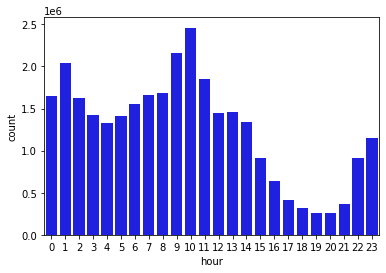

In [ ]:
# Spread of datapoints by time
sns.countplot(x = hours, color = 'blue')

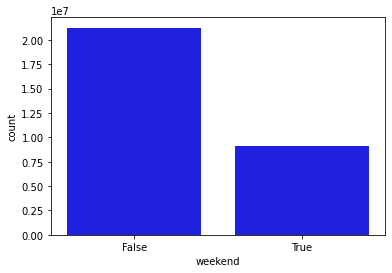

In [ ]:
# Spread of datapoints by weekend / no weekend
weekend = df_formatted['weekend']
sns.countplot(x = weekend, color = 'blue')

# 2) Analysing the slowest trips in the dataset

In [ ]:
# get mean speed of each trajectory
mean_speed = df_processed.groupby('trj_id')['speed'].agg(mean_speed = ('mean'))

# extract trajectories with valid mean speed
mean_speed = mean_speed[mean_speed['mean_speed'].notnull()]

# sort by mean_speed
mean_speed.sort_values('mean_speed', inplace = True)

# retrieve slowest 100 trajectories 
slowest_trajectories = mean_speed.nsmallest(100, columns = 'mean_speed').index

In [ ]:
# function to get the lat and lng in an array given df and id
def get_route(df, trj_id):
    return df.query('trj_id == ' + f"'{trj_id}'").sort_values("pingtimestamp")[["rawlat", "rawlng","speed","pingtimestamp"]]

In [ ]:
route_no = 0 # change this number to get different slowest routes 0-99
route = get_route(df_formatted, slowest_trajectories[route_no])
route.head()

,rawlat,rawlng,speed,pingtimestamp
2610986,1.438217,103.789413,4.30,1555369514
505667,1.438209,103.789391,3.11,1555369515
510847,1.438203,103.789375,1.39,1555369516
1709586,1.438198,103.789368,0.60,1555369517
504584,1.438195,103.789360,0.32,1555369518


In [ ]:
# Visualising the trajectory inside Kepler

map1 = KeplerGl(height=500)
map1.add_data(data=route, name="Jakarta1")
map1

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'Jakarta1': {'index': [2610986, 505667, 510847, 1709586, 504584, 2113507, 864514, 1697999, 1862…

In [ ]:
# Exporting to csv
route.to_csv('route0.csv')

# 3) Analysing driver trips by area

Coordinates to divide Singapore:


*, 103.769909 # west/central split


*, 103.906371 # central/east split


1.344874, * # North/central split


In [ ]:
#get the start point of each trip
df_processed = df_formatted.loc[df_formatted.groupby('trj_id')['pingtimestamp'].idxmin()]
df_processed

,trj_id,pingtimestamp,rawlat,rawlng,speed,weekend,hour
1308294,18633,1555723043,1.410324,103.778748,8.690000,True,1
1308294,75896,1555839763,1.278717,103.823524,22.762123,True,9
1308294,83273,1555756567,1.323453,103.709648,18.797823,True,10
1308294,10,1554809147,1.301775,103.799255,5.851406,False,11
1308294,44371,1555875334,1.424367,103.791840,22.315727,True,19
...,...,...,...,...,...,...,...
858461,78005,1555710656,1.365528,103.953194,25.209021,False,21
858461,78632,1555052032,1.333157,103.764572,16.570000,False,6
858461,81936,1555814838,1.378257,103.924026,17.260000,True,2
858461,9984,1555724314,1.331534,103.723389,14.462424,True,1


In [ ]:
# get the trips starting in the North, edit coordinates to get different SG regions
df_processed = df_processed.loc[(df_processed['rawlng'] > 103.769909) & (df_processed['rawlng'] < 103.906371) & (df_processed['rawlat'] > 1.344874)]
df_processed.shape

(85303, 7)

In [ ]:
# get the trips on weekdays
df_processed = df_processed.loc[(df_processed['weekend'] == False)] # edit False to True to get weekend trips
df_processed.head()

,trj_id,pingtimestamp,rawlat,rawlng,speed,weekend,hour
2848570,778,1555599215,1.426750,103.784340,16.480000,False,14
2848570,71386,1555428355,1.393151,103.775261,17.987165,False,15
2848570,3738,1555366313,1.366167,103.779457,26.940001,False,22
1796055,28056,1554871692,1.380767,103.858391,23.466757,False,4
1796055,45274,1554799976,1.422280,103.863594,3.850000,False,8


In [ ]:
# Get data for a specific timing
df_processed = df_processed.loc[(df_processed['hour']) == 18]
df_processed.head()

,trj_id,pingtimestamp,rawlat,rawlng,speed,weekend,hour
2745325,79271,1555527431,1.396321,103.842911,27.059999,False,18
1022455,43782,1555438798,1.362226,103.900116,17.115297,False,18
1416318,44140,1555352985,1.384689,103.858322,25.840000,False,18
2937796,57705,1555527471,1.408941,103.807800,21.020000,False,18
192094,24289,1555613830,1.387707,103.858238,21.240000,False,18


In [ ]:
# Drop unnecessary columns and tidy df
df_processed = df_processed.drop(columns=['speed','trj_id','hour','pingtimestamp','weekend'])
df_processed.head()

,rawlat,rawlng
2745325,1.396321,103.842911
1022455,1.362226,103.900116
1416318,1.384689,103.858322
2937796,1.408941,103.807800
192094,1.387707,103.858238


In [ ]:
# Visualisation in Kepler

map1 = KeplerGl(height=500)
map1.add_data(data=df_processed, name="Singapore_North_18")
map1

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'Singapore_CBD': {'index': [2745325, 1022455, 1416318, 2937796, 192094, 466119, 2134584, 971121…

In [ ]:
df_processed.to_csv("Singapore_North_18.csv")

# 4) Analysing driver trips by time

In [ ]:
df_processed = df_formatted.loc[(df_formatted['hour'] == 18) & (df_formatted['weekend'] == True)]
df_processed.sample(10)

,trj_id,pingtimestamp,rawlat,rawlng,speed,weekend,hour
1780976,77844,1555871934,1.377510,103.858498,18.572226,True,18
2699824,79489,1555786316,1.347300,103.953590,25.619999,True,18
934725,16533,1555783835,1.389018,103.866447,18.645132,True,18
1109522,81723,1555179085,1.344968,103.740807,24.578501,True,18
659785,33947,1555267823,1.346114,103.799423,22.320000,True,18
2499289,69292,1555872965,1.338190,103.981171,13.900000,True,18
805938,70274,1555783238,1.296599,103.831078,15.560863,True,18
2318652,17556,1555784130,1.335552,103.810516,19.651571,True,18
1613313,79496,1555785201,1.324862,103.899696,23.546394,True,18
1635008,2850,1555179857,1.371280,103.888130,12.627934,True,18


In [ ]:
# Slicing only necessary information
df_processed = df_processed.drop(columns=['trj_id','pingtimestamp','weekend','hour'])
df_processed.shape

(109263, 3)

In [ ]:
# Visualisation inside Kepler

map1 = KeplerGl(height=500)
map1.add_data(data=df_processed, name="Singapore_18_weekend")
map1

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'Singapore_18_weekend': {'index': [15882, 15887, 15953, 16126, 16196, 16288, 16320, 16328, 1637…

In [ ]:
# Exporting to csv 
df_processed.to_csv('Singapore_weekend_18.csv')